In [1]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys

import scanpy as sc

In [2]:
adata = sc.read('/home/ratopin/big_data/nmr/cerebral_cortex_nmr_adata_multiple_final_ann12.h5ad')

In [3]:
adata.var_names[adata.var_names.str.contains("CHR", case=False)]

Index(['CHRM2', 'CHRNA7', 'CHRNB3', 'CHRDL1', 'CHRNA10', 'CHRDL2', 'CHRND'], dtype='object')

In [4]:
"Tmem119" in adata.var_names

False

In [5]:
final_ann = pd.read_csv('./final_ann_raquel.csv', index_col=0)
final_ann.index = final_ann.index.astype(str)
final_ann.head(2)

,top_DEG,top_expr_genes,Predicción Raquel (major field),Predicción Raquel (group),Predicción Raquel (type),Predicción Raquel (specific),Predicción Raquel (layer),Predicción Raquel (markers),Rol Funcional
leiden_1.5,,,,,,,,,
0,"['KCNIP4', 'GRIK2', 'CELF2', 'TAFA1', 'LRP1B',...","['ENSHGLG00000012049', 'LRP1B', 'GRIK2', 'NRG1...",Excitatory Neuron,Neuron,IT Proyecting Neuron,IT Intratelencephalic,L3/4,KCNIP4+ GRIK2+,Procesamiento de asociación media.
1,"['SLIT3', 'EPHA6', 'EPHA3', 'NKAIN3', 'NEBL', ...","['LRP1B', 'ENSHGLG00000012049', 'GRIK2', 'TENM...",Excitatory Neuron,Neuron,IT Proyecting Neuron,IT Topographic,L4/5a,EPHA6+ EPHA3+,Establecimiento de mapas sensoriales.


In [6]:
adata.obs['major_field'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (major field)'].astype('category'))
adata.obs['celltype_group'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (group)'].astype('category'))
adata.obs['final_celltype'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (type)'].astype('category'))
adata.obs['specific_celltype'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (specific)'].astype('category'))
adata.obs['celltype_layer'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (layer)'].astype('category'))
adata.obs['celltype_markers'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (markers)'].astype('category'))

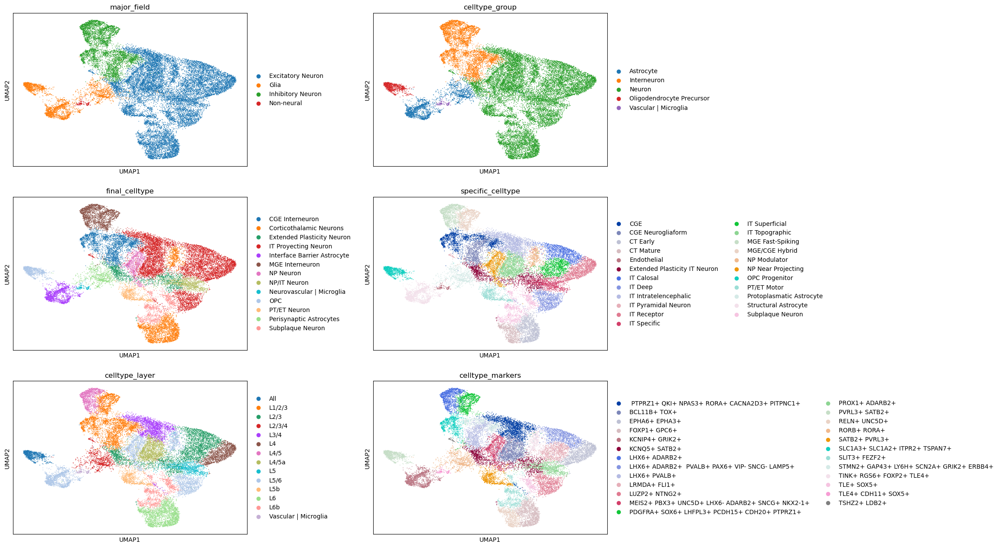

In [7]:
sc.pl.umap(adata, color=['major_field', 'celltype_group', 'final_celltype','specific_celltype', 'celltype_layer', 'celltype_markers'], wspace=0.4, ncols=2, hspace=0.2)

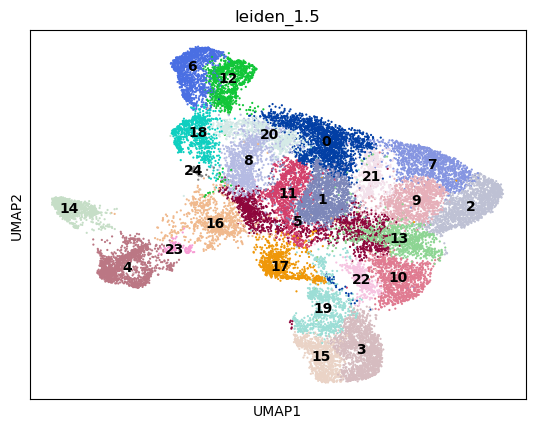

In [8]:
sc.pl.umap(adata, color='leiden_1.5', wspace=0.2,ncols = 4, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')

Genes de confirmación necesarios:

#### Linaje de Interneuronas:
- GAD1 o GAD2 (confirmar que son GABAergicas)
- LHX6 (para confirmar el origen MGE en los grupos PVALB+)
- PROX1 (origen CGE que sobrevive al estado neonatal).
#### Subtipos de Interneuronas:
- SST (Somatostatina) Para ver si alguna de tus PVALB+ es en realidad una interneurona Martinotti
- ID2 (Para confirmar si las ADARB2+ son de la Capa 1).
- CCK (Muy común en interneuronas CGE de la rata topo).
#### Capas de Neuronas Excitadoras:
- CUX2 (Para confirmar Capas 2/3 frente a Capa 4).
- FEZF2 (Para distinguir neuronas de salida ET/PT de las IT en la Capa 5).
- FOXP2 (Para confirmar neuronas de la Capa 6).
#### Estado de Maduración:
- SYT1 o SNAP25 (Para saber si las neuronas con STMN2 ya están haciendo sinapsis activas).
- MKI67 (Ki-67) (Para saber si los OPCs están en fase de división).

In [9]:
other_markers = ['GAD1','GAD2', 'LHX6', 'PVALB','PROX1', 'SST', 'ID2', 'ADARB2', 'CCK', 'CUX2', 'FEZF2', 'FOXP2', 'SYT1', 'SNAP25','MKI67']

In [10]:
present_markers = [x for x in other_markers if x in adata.var_names]

In [11]:
sc.tl.dendrogram(adata, groupby='leiden_1.5', use_rep='X_scvi')

In [18]:
all_markers = {
'Mature Neurons': ['SYT1', 'SNAP25', 'FEZF2', 'KCNB1'],
'Corticothalamic Neurons':['TLE4', 'FEZF2'],
'IT Neurons':['SATB2'],
'L1':['ID2', 'NDNF', 'VIP'],
'L2/3 Neurons':['CUX1','CARTPT','PRSS12'],
'L4 Neurons':['RORB', 'UNC5D'],
'L5 Neurons':['TSHZ2', 'LDB2', 'BCL11B', 'PCP4', 'SLC17A7'],
'L6 Neurons':['SYT6', 'FOXP2', 'TBR1'],
'Immature Neurons':['TOX', 'DCX'],
'Progenitor': ['SHH'],
'Maintenance': ['RORA', 'PTPRZ1', 'ENSHGLG00000003074', 'GFAP'],
'Plasticity': ['STMN2', 'GAP43', 'LY6H'],
'OPC': ['SOX6', 'PTPRZ1', 'PCDH15', 'LHFPL3', 'GPR56'],
'Hematoencephalic Barrier': ['ADGRG6'],
'Endothelial':['VWF'],
'Vascular':['MFSD2A','PECAM1','FLT1','VEGFC'],
'Microglia':['LRMDA','CX3CR1','P2RY12', 'C1QC', 'C1QBP', 'CSF1R', 'NFE2L2', 'AIF1', 'TUBB2B'],
'GABAergic Neurons': ['GAD1','GAD2'],
'CGE Interneuron':['CXCL12','ADARB2', 'PROX1', 'NR2F2', 'LHX6'],
'CGE Interneuron Neurogliaform':['LAMP5','PAX6'],
'CGE Disinhibition':['VIP','HTR3A','TAC3'],
'MGE Interneuron': ['LHX6'],
'MGE Rapid Potential': ['PVALB', 'NXPH1', 'NKX2-1'],
'MGE Slow Potential': ['SST','CHODL']
}

categories: 0, 1, 2, etc.
var_group_labels: Mature Neurons, Corticothalamic Neurons, IT Neurons, etc.


{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

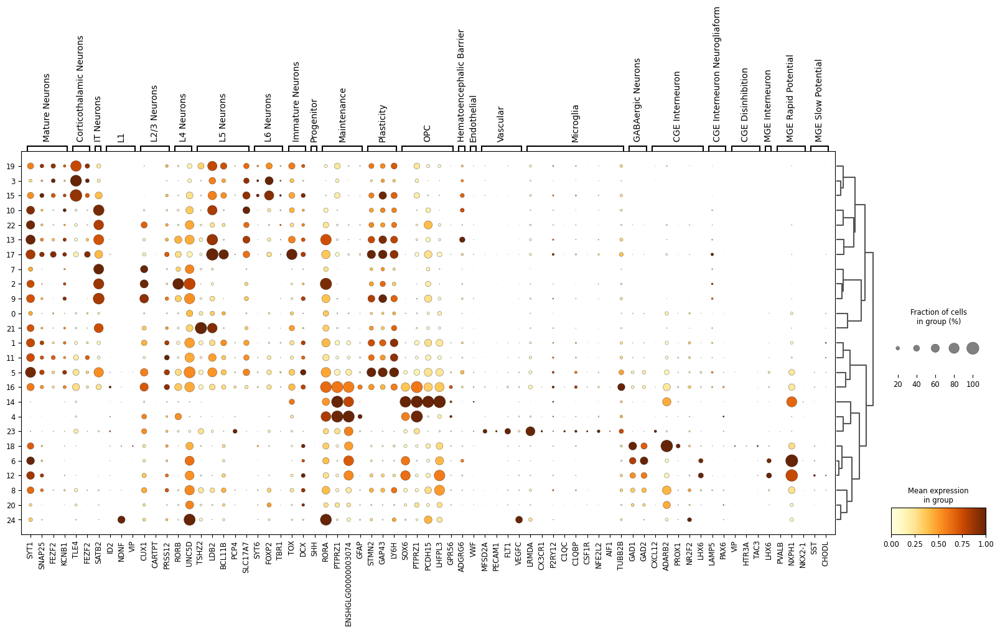

In [19]:
sc.pl.dotplot(adata, var_names=all_markers, groupby='leiden_1.5', standard_scale='var', color_map='YlOrBr', dendrogram=True, figsize=(20,8), show=False)

In [20]:
sc.tl.dendrogram(adata, groupby='final_celltype', use_rep='X_scvi')

categories: CGE Interneuron, Corticothalamic Neurons, Extended Plasticity Neuron, etc.
var_group_labels: Mature Neurons, Corticothalamic Neurons, IT Neurons, etc.


{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

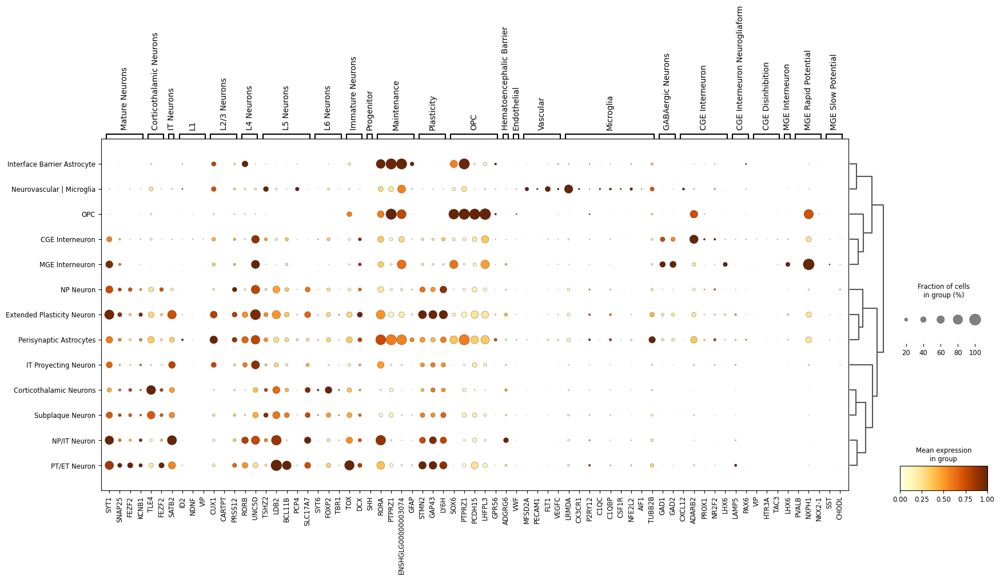

In [21]:
sc.pl.dotplot(adata, var_names=all_markers, groupby='final_celltype', standard_scale='var', color_map='YlOrBr', dendrogram=True, figsize=(20,8), show=False)

categories: CGE, CGE Neurogliaform, CT Early, etc.
var_group_labels: Mature Neurons, Corticothalamic Neurons, IT Neurons, etc.


{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

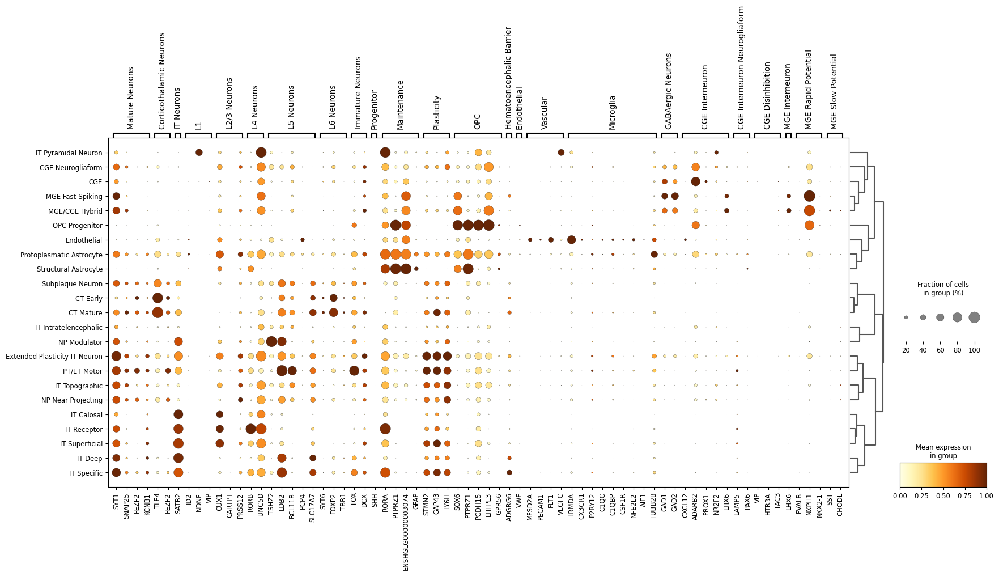

In [22]:
sc.pl.dotplot(adata, var_names=all_markers, groupby='specific_celltype', standard_scale='var', color_map='YlOrBr', dendrogram=True, figsize=(20,8), show=False)

categories: All, L1/2/3, L2/3, etc.
var_group_labels: Mature Neurons, Corticothalamic Neurons, IT Neurons, etc.


{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

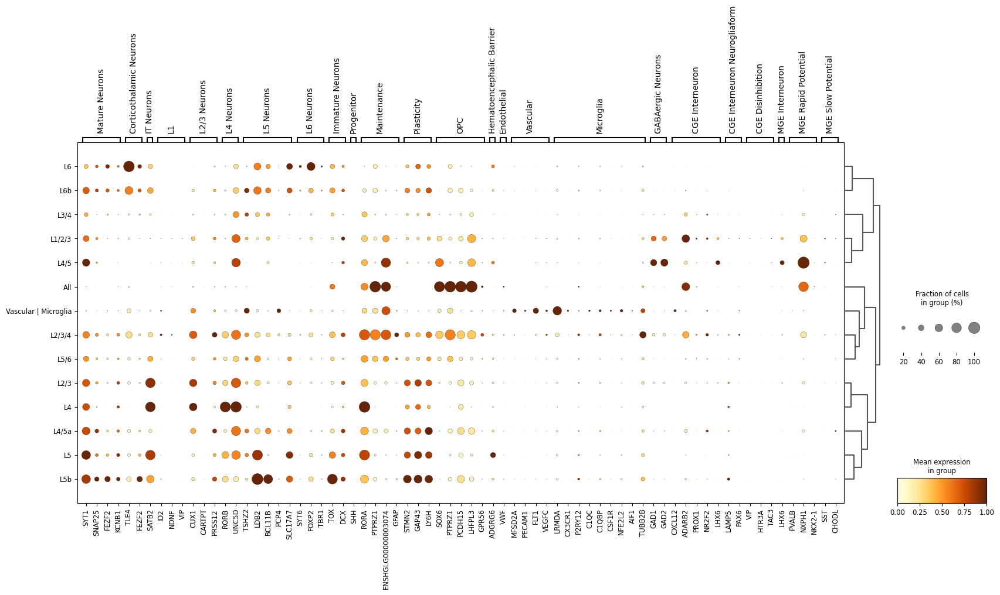

In [23]:
sc.pl.dotplot(adata, var_names=all_markers, groupby='celltype_layer', standard_scale='var', color_map='YlOrBr', dendrogram=True, figsize=(20,8), show=False)

In [ ]:
#PT/ET Neuron: Lamp5+, LDB2, TOX, BCL11B, STY1, STMN2, GAP43, LY6H, FEZF2

In [ ]:

sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon", use_raw=False)

In [ ]:
import pandas as pd
import numpy as np

deg_df = sc.get.rank_genes_groups_df(adata, group=None)

top_n = 20

top_genes = (
    deg_df
    .sort_values(["group", "scores"], ascending=[True, False])
    .groupby("group")
    .head(top_n)
)

gene_list = top_genes["names"].unique().tolist()
sc.tl.dendrogram(adata, groupby="final_celltype", use_rep="X_scvi")

In [ ]:
sc.pl.heatmap(
    adata,
    var_names=gene_list,
    groupby="leiden",
    dendrogram=True,
    standard_scale="var",   # scale per gene
    cmap="viridis",
    swap_axes=False
)

CGE Interneuron CXCL12- ADARB2+, PROX1+, NR2F2+ LHX6- NKX2-1- 


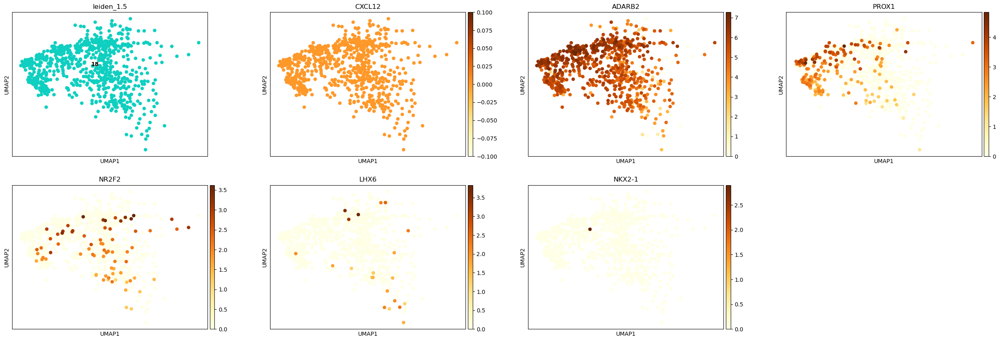

CGE Interneuron Inhibición lenta (Neurogliaformes)


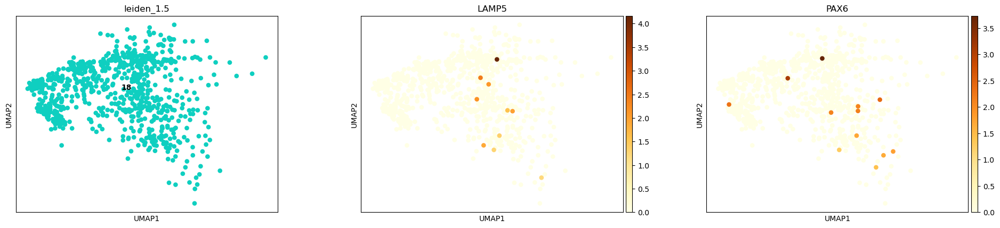

CGE Interneuronas de la Capa 1


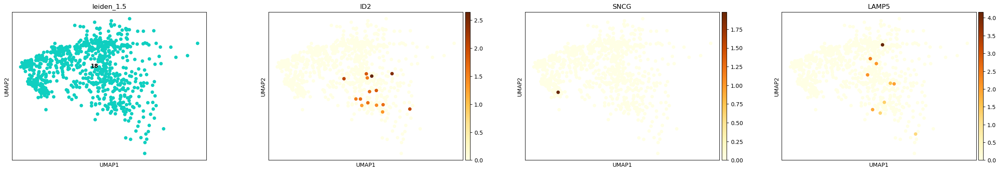

CGE Desinhibición (inhiben a otras interneuronas) VIP+, HTR3A+, TAC3+


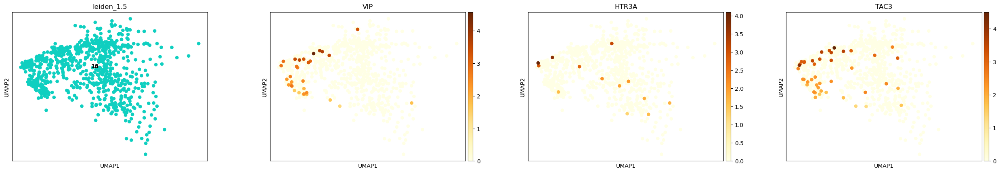

MGE Potenciales rápidos (Células en Cesta) PVALB+, KCNB1+, LHX6+


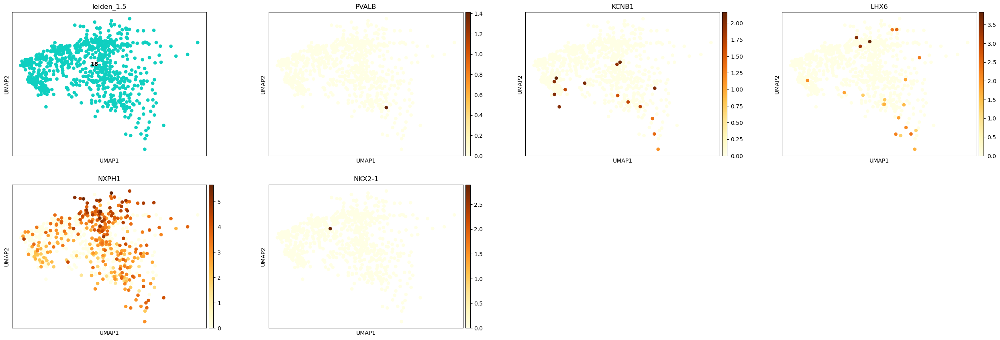

MGE Potenciales lentos (Células Martinotti) SST+, CHODL+, LHX6+


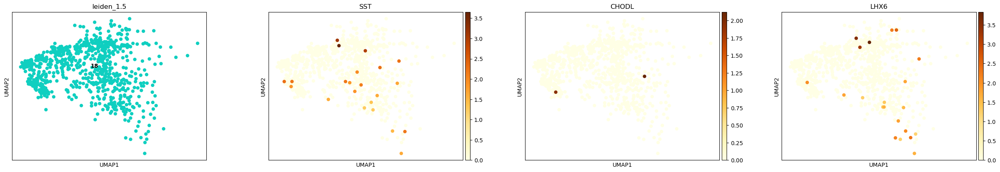

In [84]:
#Check for Interneurons on group
# 20: SNCG+ NKX2-1+ ADARB2+
# 8: LHX6+ NKX2-1- CXCL12+ ADARB2+ NR2F2+ PVALB+ LAMP5+ PAX6+ ID2- SNCG- VIP- HTR3A- TAC3-
# 6: CXCL12+ PVALB+ LHX6+
sel_group = '18'
n_cols=4

#CGE Interneuron LHX6- 'NKX2-1-','CXCL12-' ADARB2+, PROX1+, NR2F2+
print('CGE Interneuron CXCL12- ADARB2+, PROX1+, NR2F2+ LHX6- NKX2-1- ')
sc.pl.umap(adata[adata.obs['leiden_1.5']==sel_group,:], color=['leiden_1.5','CXCL12','ADARB2', 'PROX1', 'NR2F2', 'LHX6','NKX2-1'], wspace=0.2,ncols = n_cols, hspace=0.2, legend_loc='on data', color_map='YlOrBr')

# CGE Interneuron Inhibición lenta (Neurogliaformes). LAMP5+, PAX6+
print('CGE Interneuron Inhibición lenta (Neurogliaformes)')
sc.pl.umap(adata[adata.obs['leiden_1.5']==sel_group,:], color=['leiden_1.5', 'LAMP5','PAX6'], wspace=0.2,ncols = n_cols, hspace=0.2, legend_loc='on data', color_map='YlOrBr')

# CGE Interneuronas de la Capa 1. ID2+ SNCG+ LAMP5+
print('CGE Interneuronas de la Capa 1')
sc.pl.umap(adata[adata.obs['leiden_1.5']==sel_group,:], color=['leiden_1.5', 'ID2','SNCG','LAMP5'], wspace=0.2,ncols = n_cols, hspace=0.2, legend_loc='on data', color_map='YlOrBr')

# VIP, HTR3A, TAC3 CGE Desinhibición (inhiben a otras interneuronas).
print('CGE Desinhibición (inhiben a otras interneuronas) VIP+, HTR3A+, TAC3+')
sc.pl.umap(adata[adata.obs['leiden_1.5']==sel_group,:], color=['leiden_1.5', 'VIP','HTR3A','TAC3'], wspace=0.2,ncols = n_cols, hspace=0.2, legend_loc='on data', color_map='YlOrBr')

# PVALB, KCNB1, LHX6	MGE	Potenciales rápidos (Células en Cesta)
print('MGE Potenciales rápidos (Células en Cesta) PVALB+, KCNB1+, LHX6+')
sc.pl.umap(adata[adata.obs['leiden_1.5']==sel_group,:], color=['leiden_1.5', 'PVALB','KCNB1','LHX6', 'NXPH1', 'NKX2-1'], wspace=0.2,ncols = n_cols, hspace=0.2, legend_loc='on data', color_map='YlOrBr')

# SST, CHODL, LHX6 MGE Potenciales lentos (Células Martinotti)
print('MGE Potenciales lentos (Células Martinotti) SST+, CHODL+, LHX6+')
sc.pl.umap(adata[adata.obs['leiden_1.5']==sel_group,:], color=['leiden_1.5', 'SST','CHODL','LHX6'], wspace=0.2,ncols = n_cols, hspace=0.2, legend_loc='on data', color_map='YlOrBr')


Microglia LRMDA, CX3CR1, P2RY12, C1QC, C1QBP, CSF1R


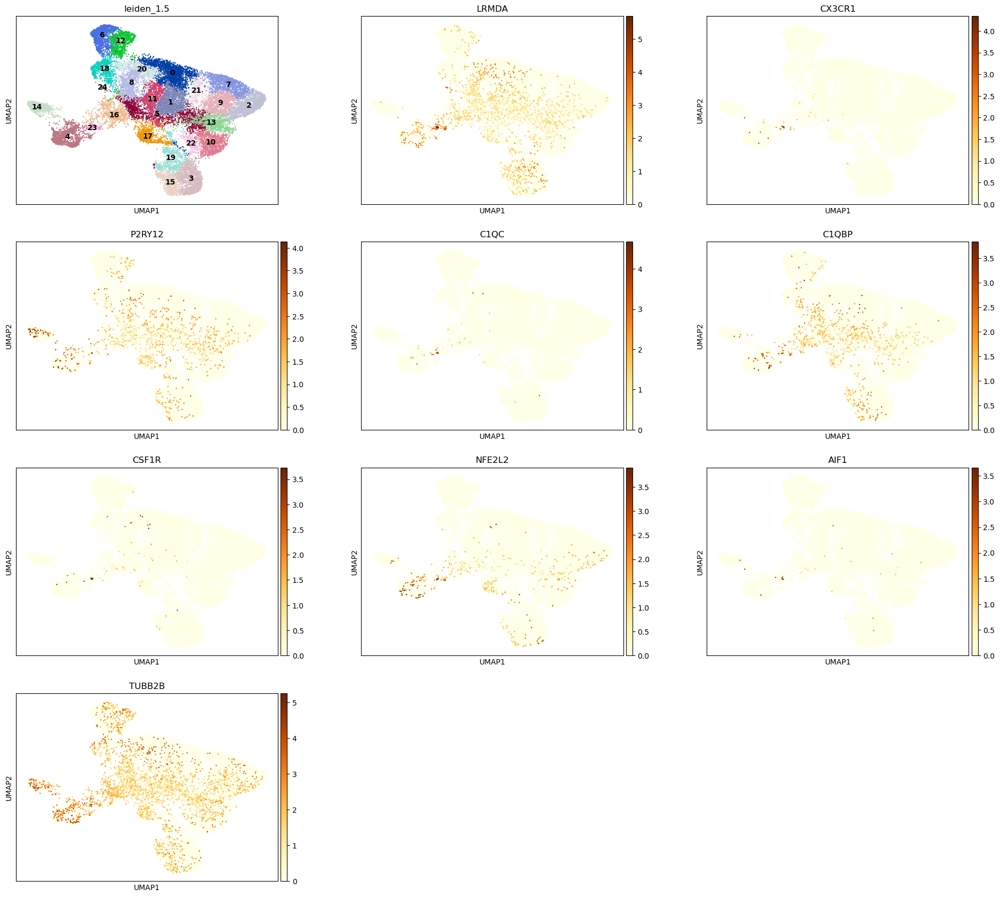

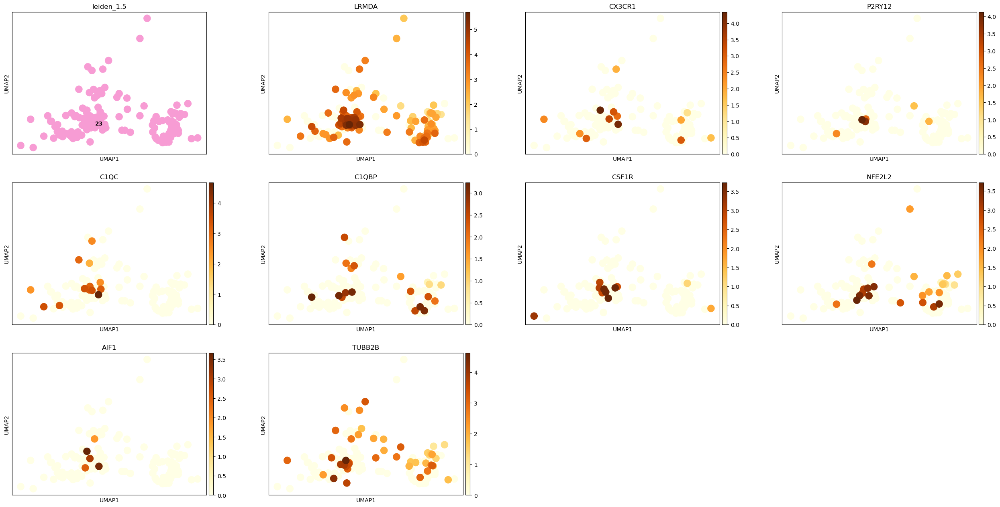

In [61]:
#Microglia LRMDA, CX3CR1, P2RY12, C1QC, C1QBP, CSF1R (LMRDA in brain can be associated to Glia and Microglia https://www.proteinatlas.org/ENSG00000148655-LRMDA)
# In adults 'TUBB2B' is exclusive of microglia but in development is also expressed in prgenitor cells.
print('Microglia LRMDA, CX3CR1, P2RY12, C1QC, C1QBP, CSF1R')
sc.pl.umap(adata, color=['leiden_1.5', 'LRMDA','CX3CR1','P2RY12', 'C1QC', 'C1QBP', 'CSF1R', 'NFE2L2', 'AIF1', 'TUBB2B'], wspace=0.2,ncols = 3, hspace=0.2,size=12, legend_loc='on data', color_map='YlOrBr')
#Microglia
sc.pl.umap(adata[adata.obs['leiden_1.5']=='23',:], color=['leiden_1.5','LRMDA', 'CX3CR1','P2RY12', 'C1QC', 'C1QBP', 'CSF1R','NFE2L2', 'AIF1', 'TUBB2B'], wspace=0.2,ncols = 4, hspace=0.2, legend_loc='on data', color_map='YlOrBr')

Vascular CLDN5 (Claudin-5), PECAM1 (CD31), VWF (von Willebrand factor), FLT1


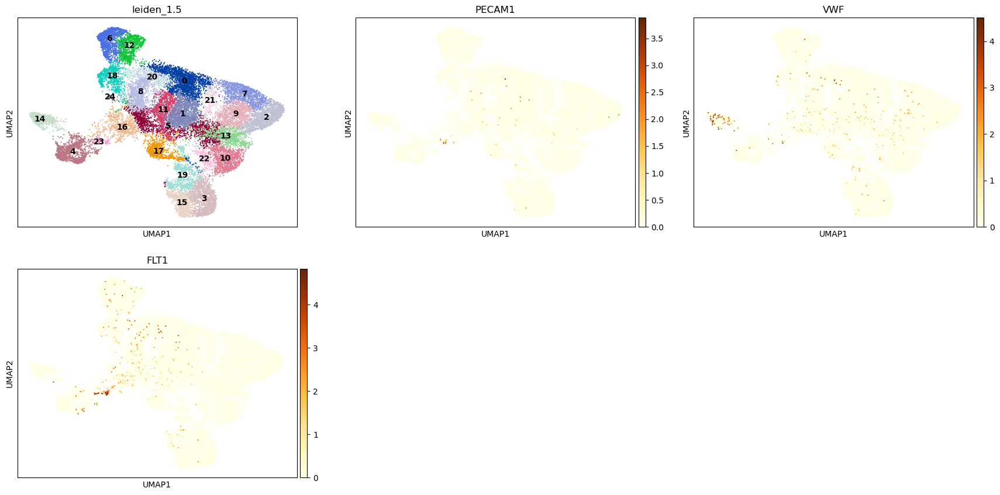

Arterial: VEGFC, ARL15.


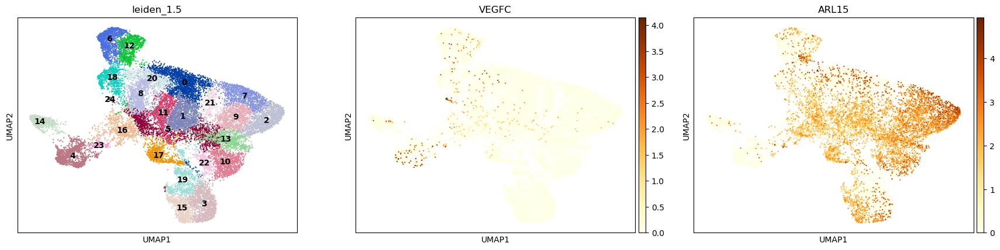

Capillary: MFSD2A, SLC7A5.


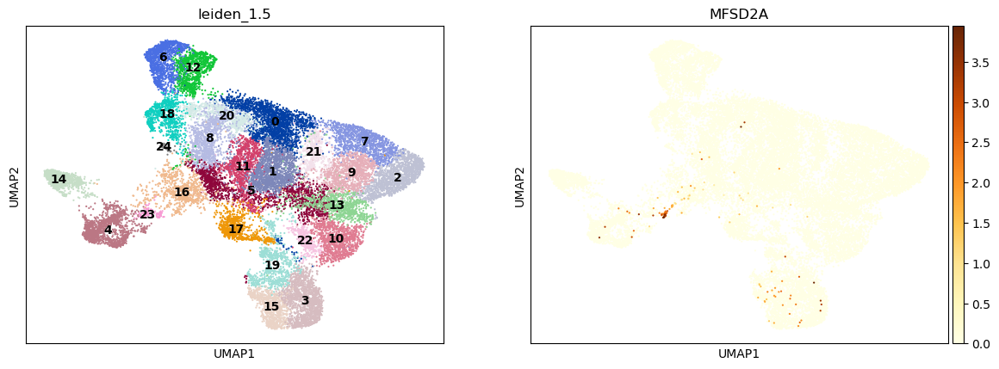

 blood-brain barrier: ADGRG6 cotrasted with GPR56


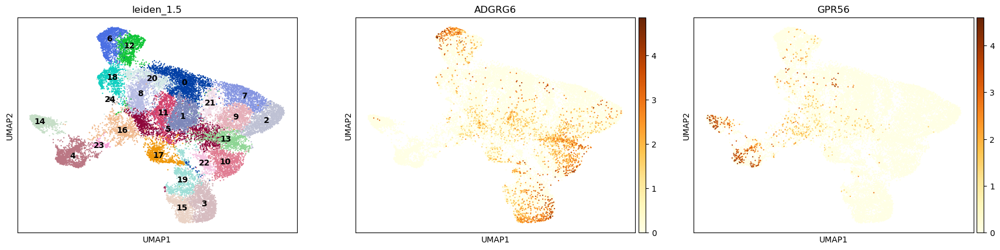

In [42]:
# Vascular CLDN5 (Claudin-5), PECAM1 (CD31), VWF (von Willebrand factor), FLT1
print('Vascular CLDN5 (Claudin-5), PECAM1 (CD31), VWF (von Willebrand factor), FLT1')
sc.pl.umap(adata, color=['leiden_1.5', 'PECAM1','VWF', 'FLT1'], wspace=0.1,ncols = 3, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')
print('Arterial: VEGFC, ARL15.')
sc.pl.umap(adata, color=['leiden_1.5', 'VEGFC', 'ARL15'], wspace=0.1,ncols = 3, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')
print('Capillary: MFSD2A, SLC7A5.')
sc.pl.umap(adata, color=['leiden_1.5', 'MFSD2A'], wspace=0.1,ncols = 3, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')
print(' blood-brain barrier: ADGRG6 cotrasted with GPR56')
sc.pl.umap(adata, color=['leiden_1.5', 'ADGRG6','GPR56'], wspace=0.1,ncols = 3, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')

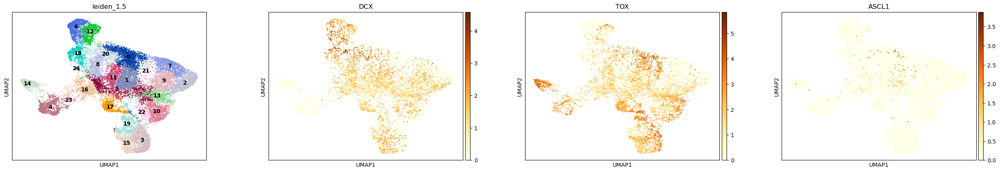

In [78]:
# Inmature Neurons DCX / ASCL1 progenitor cells can guide astrocyte to Neuron Transition
sc.pl.umap(adata, color=['leiden_1.5', 'DCX', 'TOX', 'ASCL1'], wspace=0.2,ncols = 4, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')

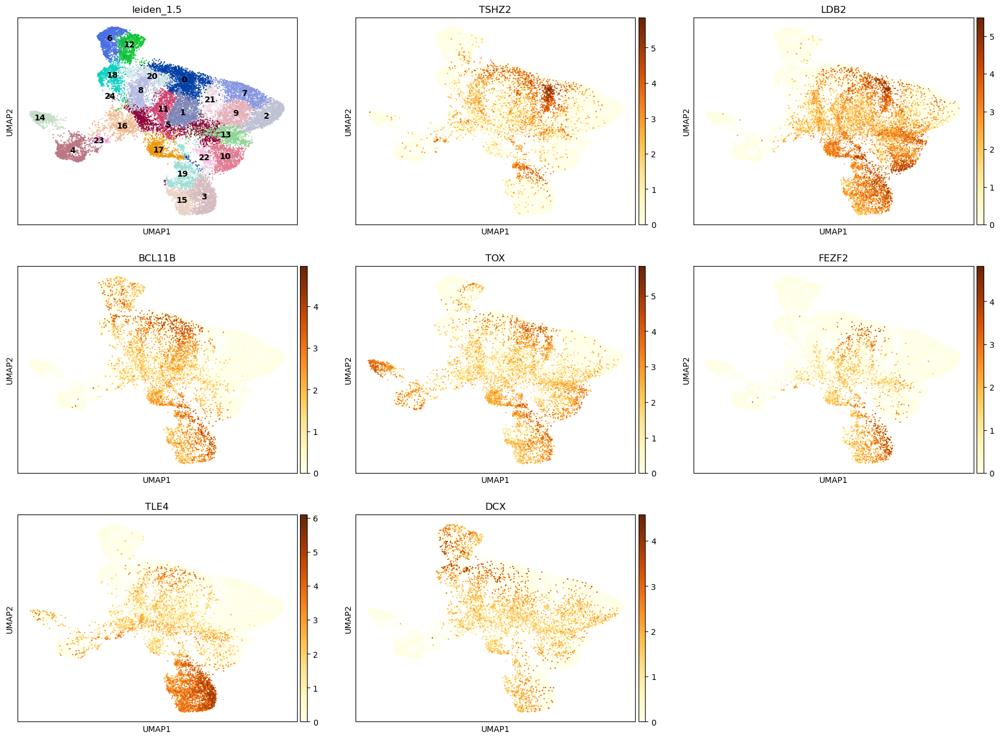

In [62]:
# Mature Neurons (Excitatory) NP Non pyramidal Neurons/ PT Pyramidal Tract Neurons
sc.pl.umap(adata, color=['leiden_1.5', 'TSHZ2', 'LDB2', 'BCL11B', 'TOX', 'FEZF2', 'TLE4', 'DCX'], wspace=0.1,ncols = 3, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')

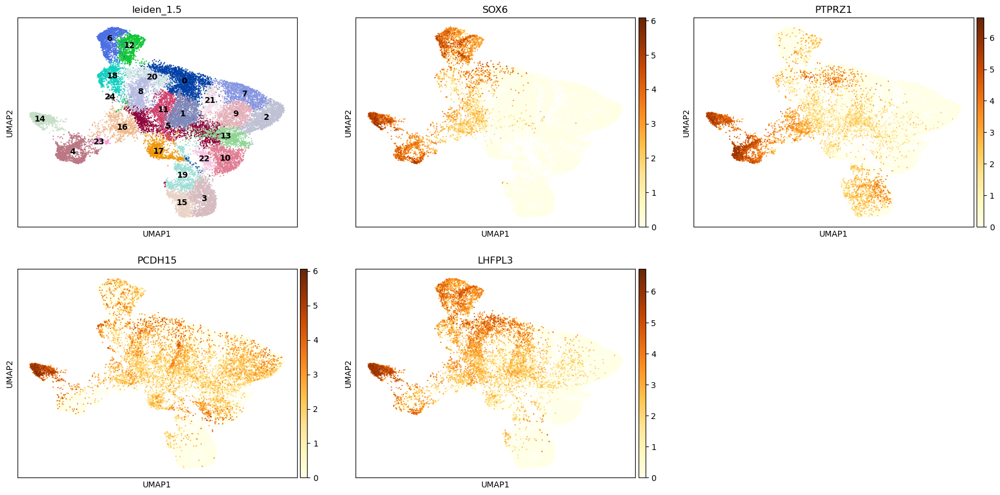

In [53]:
# OPC markers
sc.pl.umap(adata, color=['leiden_1.5', 'SOX6', 'PTPRZ1', 'PCDH15', 'LHFPL3'], wspace=0.1,ncols = 3, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')

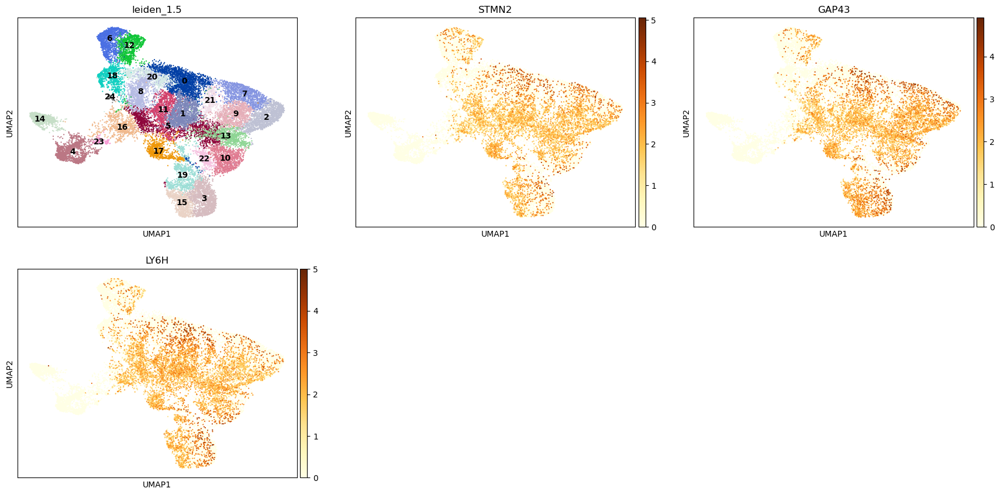

In [54]:
# Neuronas de Plasticidad Extendida
sc.pl.umap(adata, color=['leiden_1.5', 'STMN2', 'GAP43', 'LY6H'], wspace=0.1,ncols = 3, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')

Maintenance cells


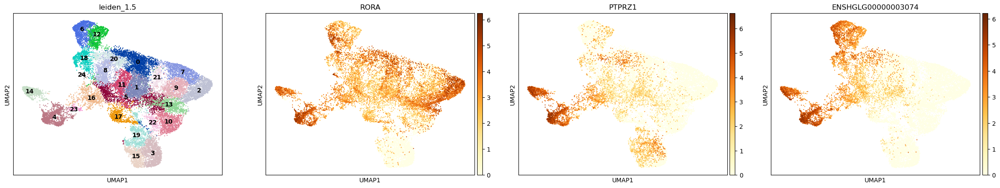

In [58]:
# Astrocitos de Interfaz RORA es un marcador de celulas Purkinje, pero tambien es expresado en astrocitos y neuronas teniendo efectos neuroprotectivos
# PTPRZ1 es un marcador de glia expresado en astrocitos y oligodendrocitos de neonatos
# QKI es expresado en Glia, especialmente oligodendrocitos y esta normalmente ausente en neuronas maduras.
print('Maintenance cells')
sc.pl.umap(adata, color=['leiden_1.5', 'RORA', 'PTPRZ1', 'ENSHGLG00000003074'], wspace=0.1,ncols = 4, hspace=0.2,size=10, legend_loc='on data', color_map='YlOrBr')

In [ ]:
'ENSHGLG00000012049'

In [4]:
final_ann = pd.read_csv('./final_ann_raquel.csv', index_col=0)
final_ann.index = final_ann.index.astype(str)
final_ann.head(2)

,top_DEG,top_expr_genes,Predicción Raquel (major field),Predicción Raquel (group),Predicción Raquel (type),Predicción Raquel (specific),Predicción Raquel (layer),Predicción Raquel (markers),Rol Funcional
leiden_1.5,,,,,,,,,
0,"['KCNIP4', 'GRIK2', 'CELF2', 'TAFA1', 'LRP1B',...","['ENSHGLG00000012049', 'LRP1B', 'GRIK2', 'NRG1...",Excitatory Neuron,Neuron,IT Proyecting Neuron,IT Intratelencephalic,L3/4,KCNIP4+ GRIK2+,Procesamiento de asociación media.
1,"['SLIT3', 'EPHA6', 'EPHA3', 'NKAIN3', 'NEBL', ...","['LRP1B', 'ENSHGLG00000012049', 'GRIK2', 'TENM...",Excitatory Neuron,Neuron,IT Proyecting Neuron,IT Topographic,L4/5a,EPHA6+ EPHA3+,Establecimiento de mapas sensoriales.


In [ ]:
adata.obs['major_field'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (major field)'].astype('category'))
adata.obs['celltype_group'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (group)'].astype('category'))
adata.obs['final_celltype'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (type)'].astype('category'))
adata.obs['specific_celltype'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (specific)'].astype('category'))
adata.obs['celltype_layer'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (layer)'].astype('category'))
adata.obs['celltype_markers'] = adata.obs['leiden_1.5'].map(final_ann['Predicción Raquel (markers)'].astype('category'))


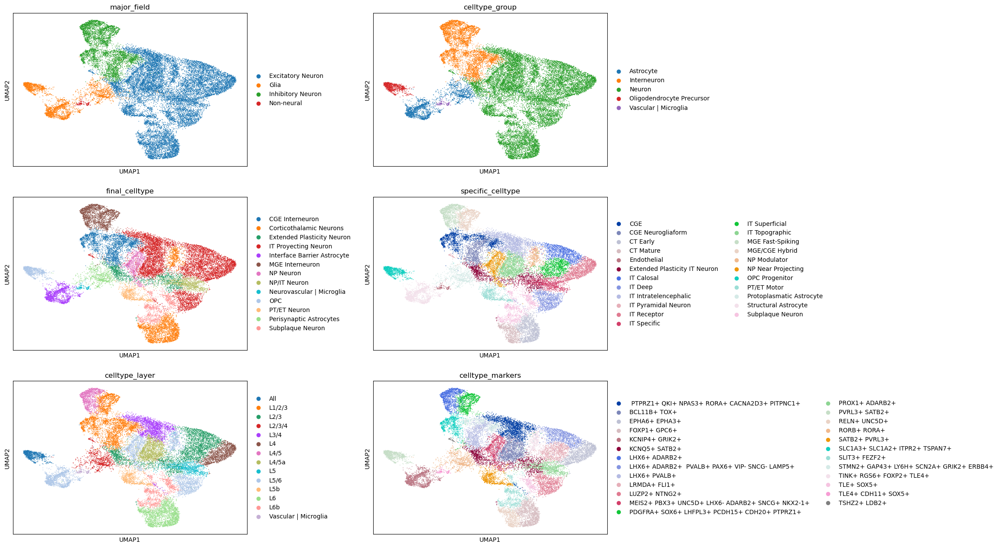

In [11]:
sc.pl.umap(adata, color=['major_field', 'celltype_group', 'final_celltype','specific_celltype', 'celltype_layer', 'celltype_markers'], wspace=0.4, ncols=2, hspace=0.2)

In [12]:
adata.write('/home/ratopin/big_data/nmr/cerebral_cortex_nmr_adata_final_ann.h5ad')